# Setup

In [1]:
!python3 -m pip install --upgrade --quiet google-genai

In [2]:
# download images, image_editing_utils.py (helper fns)
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/empty-bowl-on-empty-table.png .
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/image_editing_utils.py .
!gcloud storage cp gs://qwiklabs-gcp-00-5ea23e119474-bucket/place-setting-mask.png .

Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/empty-bowl-on-empty-table.png to file://./empty-bowl-on-empty-table.png

Average throughput: 148.8MiB/s
Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/image_editing_utils.py to file://./image_editing_utils.py
Copying gs://qwiklabs-gcp-00-5ea23e119474-bucket/place-setting-mask.png to file://./place-setting-mask.png


In [1]:
from google import genai
from google.genai.types import (
    Image,
    EditImageConfig,
    RawReferenceImage,
    MaskReferenceImage,
    MaskReferenceConfig,
)

import image_editing_utils

In [2]:
PROJECT_ID = "qwiklabs-gcp-00-5ea23e119474"
LOCATION = "us-central1"
gcs_bucket = "qwiklabs-gcp-00-5ea23e119474-bucket"

client = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=LOCATION
)

In [3]:
import os
os.environ

environ{'SHELL': '/bin/bash',
        'NV_LIBCUBLAS_VERSION': '12.5.3.2-1',
        'NVIDIA_VISIBLE_DEVICES': 'all',
        'NV_NVML_DEV_VERSION': '12.5.82-1',
        'NV_CUDNN_PACKAGE_NAME': 'libcudnn9-cuda-12',
        'NV_LIBNCCL_DEV_PACKAGE': 'libnccl-dev=2.22.3-1+cuda12.5',
        'NV_LIBNCCL_DEV_PACKAGE_VERSION': '2.22.3-1',
        'VERTEX_PRODUCT': 'COLAB_ENTERPRISE',
        'VM_GCE_METADATA_HOST': '169.254.169.254',
        'HOSTNAME': 'd68e430c931b',
        'LANGUAGE': 'en_US',
        'COLAB_TPU_1VM': '',
        'GOOGLE_CLOUD_PROJECT': 'qwiklabs-gcp-00-5ea23e119474',
        'GCE_METADATA_TIMEOUT': '3',
        'NVIDIA_REQUIRE_CUDA': 'cuda>=12.5 brand=unknown,driver>=470,driver<471 brand=grid,driver>=470,driver<471 brand=tesla,driver>=470,driver<471 brand=nvidia,driver>=470,driver<471 brand=quadro,driver>=470,driver<471 brand=quadrortx,driver>=470,driver<471 brand=nvidiartx,driver>=470,driver<471 brand=vapps,driver>=470,driver<471 brand=vpc,driver>=470,driver<471 brand

# Image

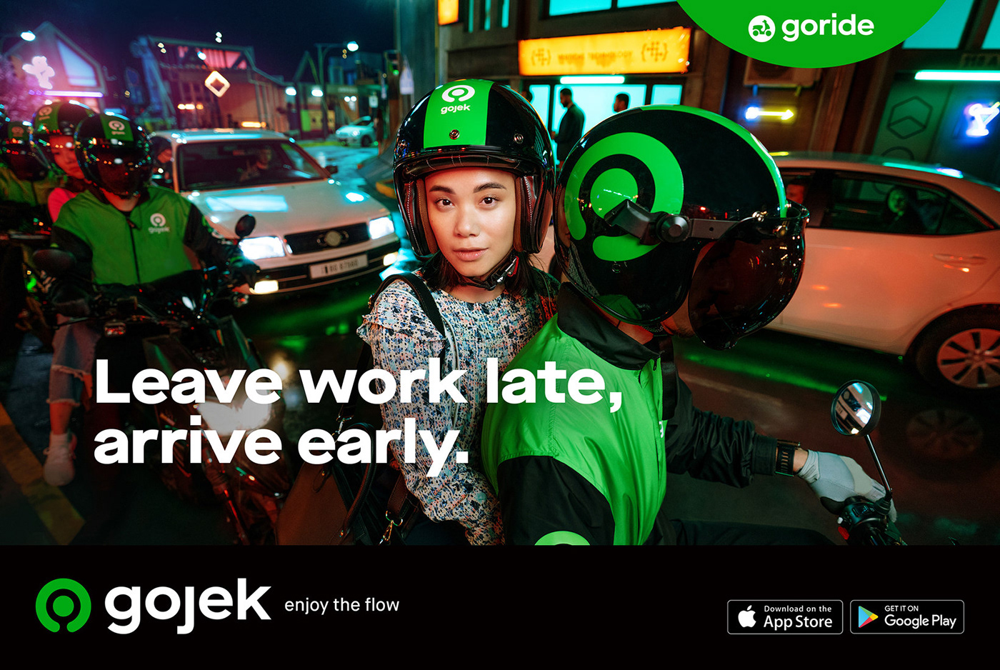

In [4]:
original_image = Image.from_file(
    location="gojek-motor-publicad.jpg",
    mime_type="image/png"
)
original_image.show()

In [6]:
dest_filename = "gojek-motor-publicad-copy.png"
original_image.save(dest_filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, dest_filename, dest_filename)

File gojek-motor-publicad-copy.png uploaded to gojek-motor-publicad-copy.png.


In [7]:
edit_model_name = "imagen-3.0-capability-001"

# Remove other objects/ad elements before removing foreground - Task 3. Use mask-free editing to make changes to overlapping objects



In [14]:
original_image

Image(
  image_bytes=b'\xff\xd8\xff\xdd\x00\x04\x00\x00\xff\xee\x00\x0eAdobe\x00d\xc0\x00\x00\x00\x01\xff\xc2\x00\x11\x08\x03\xaa\x05x\x03\x00\x11\x00\x01\x11\x01\x02\x11\x02\xff\xdb\x00\xc5\x00\x04\x05\x05\x03\x03\x03\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x01\x02\x02\x02\x02\x01\t\n\x02\x02\x02\n\x08\x07\x05\x07\n\x0b\n\x01\x06\x0c\x0c\x0c\x0c\x0c\n...',
  mime_type='image/png'
)

In [15]:
# Reference Image = Original Ad

raw_ref_image = RawReferenceImage(
    reference_image= original_image,
    reference_id=0
)


In [16]:
raw_ref_image

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\xff\xd8\xff\xdd\x00\x04\x00\x00\xff\xee\x00\x0eAdobe\x00d\xc0\x00\x00\x00\x01\xff\xc2\x00\x11\x08\x03\xaa\x05x\x03\x00\x11\x00\x01\x11\x01\x02\x11\x02\xff\xdb\x00\xc5\x00\x04\x05\x05\x03\x03\x03\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x01\x02\x02\x02\x02\x01\t\n\x02\x02\x02\n\x08\x07\x05\x07\n\x0b\n\x01\x06\x0c\x0c\x0c\x0c\x0c\n...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

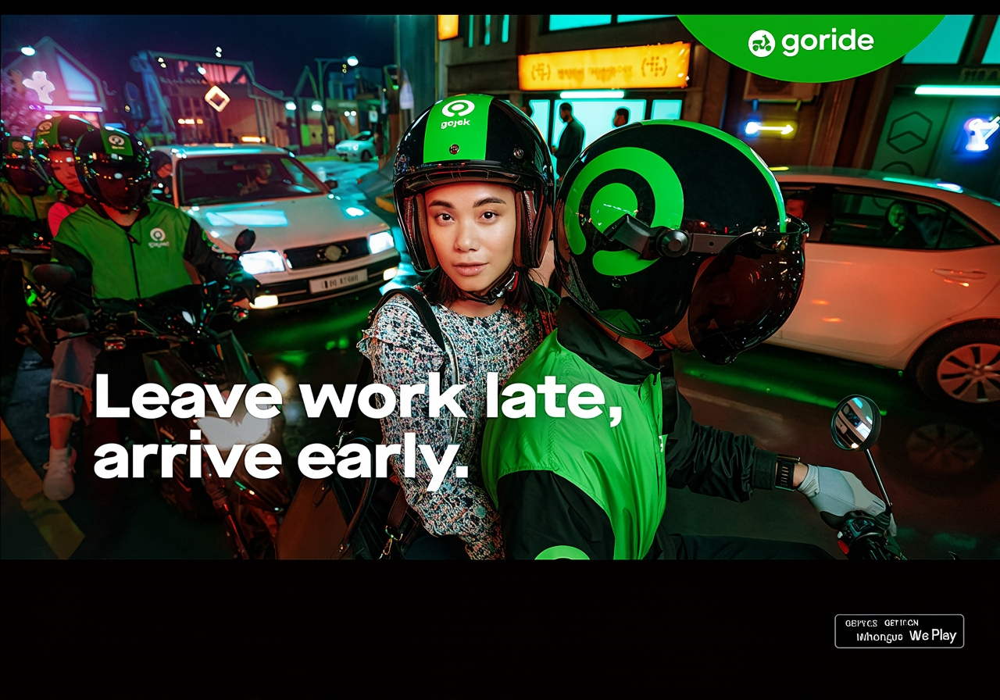

In [17]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to edit the image generally without using a mask. Run the code and make sure you see a result.

edit_prompt = "Remove the app logos"
edited_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_DEFAULT", #ENTER_THE_CORRECT_EDIT_MODE ,
        base_steps=35,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

edited_image.generated_images[0].image.show()


In [32]:
filename = "edited-image1-no-logos.png"

edited_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File edited-image1-no-logos.png uploaded to edited-image1-no-logos.png.


## Now remove app logos further - round2

In [19]:
edited_image

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [21]:
edited_image.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [22]:
raw_ref_image2 = RawReferenceImage(
    reference_image= edited_image.generated_images[0].image,
    reference_id=0
)

In [23]:
raw_ref_image2

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

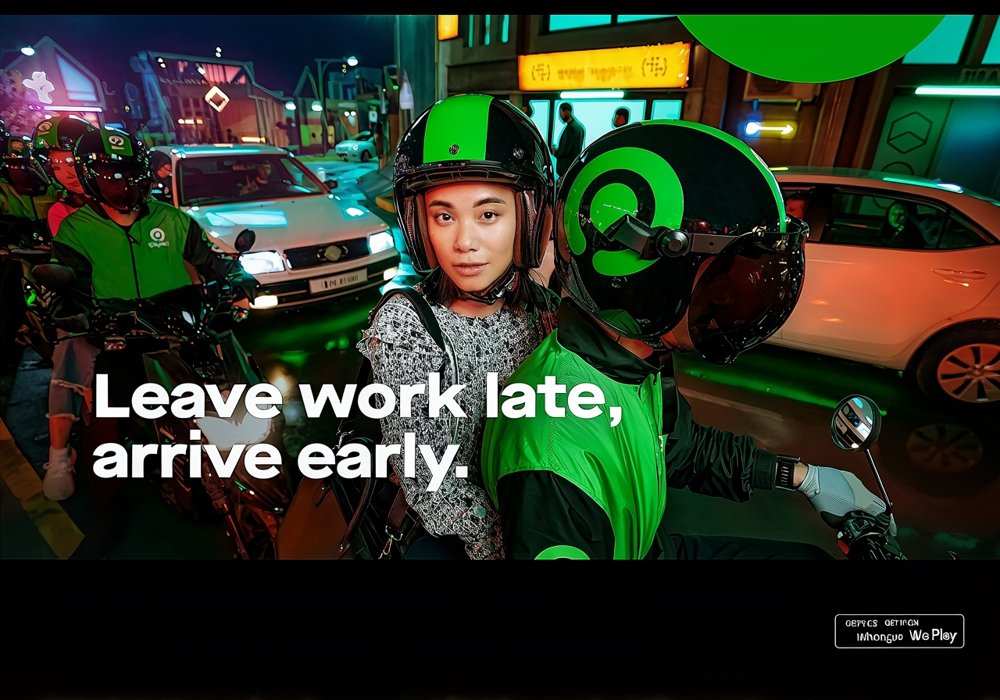

In [25]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to edit the image generally without using a mask. Run the code and make sure you see a result.

edit_prompt2 = "Remove the app logos"
edited_image2 = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image2],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_DEFAULT", #ENTER_THE_CORRECT_EDIT_MODE ,
        base_steps=35,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

edited_image2.generated_images[0].image.show()


In [33]:
filename = "edited-image2-no-logos.png"

edited_image2.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File edited-image2-no-logos.png uploaded to edited-image2-no-logos.png.


## Now remove app logos further - round3

In [27]:
edited_image2

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [28]:
edited_image2.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [29]:
raw_ref_image3 = RawReferenceImage(
    reference_image= edited_image2.generated_images[0].image,
    reference_id=0
)

In [30]:
raw_ref_image3

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

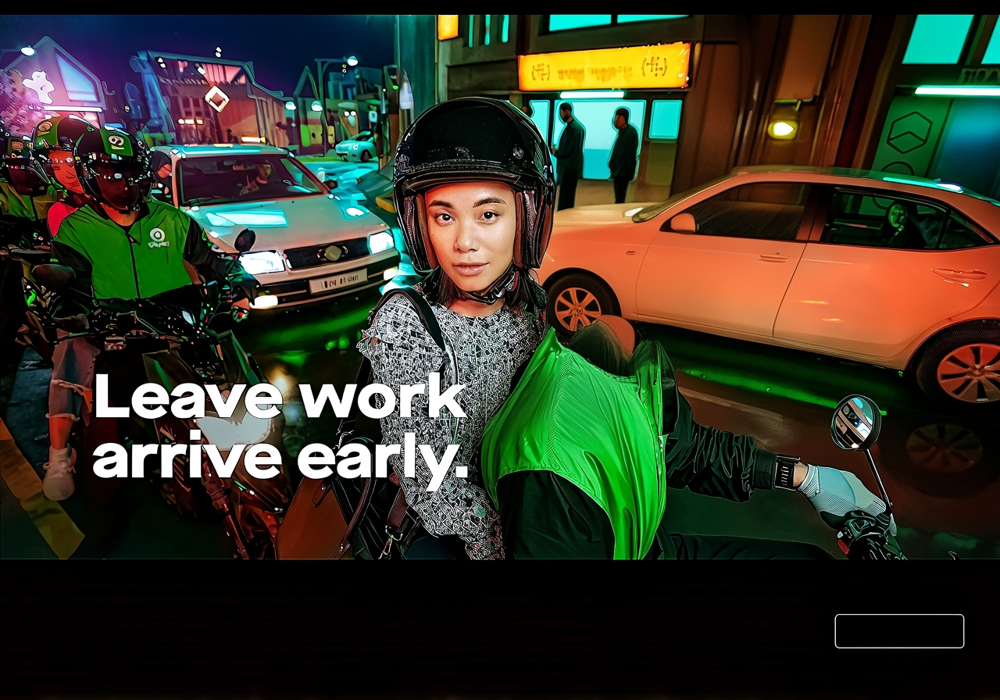

In [34]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to edit the image generally without using a mask. Run the code and make sure you see a result.

edit_prompt3 = "Remove app logos on the bottom left or right"
edited_image3 = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image3],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_DEFAULT", #ENTER_THE_CORRECT_EDIT_MODE ,
        base_steps=35,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

edited_image3.generated_images[0].image.show()


In [35]:
filename = "edited-image3-no-logos.png"

edited_image3.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File edited-image3-no-logos.png uploaded to edited-image3-no-logos.png.


## Now remove foreground - round4

In [36]:
edited_image3

EditImageResponse(
  generated_images=[
    GeneratedImage(
      image=Image(
        image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
        mime_type='image/png'
      ),
      safety_attributes=SafetyAttributes()
    ),
  ],
  sdk_http_response=HttpResponse(
    headers=<dict len=9>
  )
)

In [37]:
edited_image3.generated_images[0].image

Image(
  image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
  mime_type='image/png'
)

In [38]:
raw_ref_image4 = RawReferenceImage(
    reference_image= edited_image3.generated_images[0].image,
    reference_id=0
)

In [39]:
raw_ref_image4

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x03\x80\x08\x02\x00\x00\x00\xea\xe6IB\x00\x00\x00\x89zTXtRaw profile type iptc\x00\x00\x08\x99M\x8c1\x0e\x021\x0c\x04\xfb\xbc\xe2\x9e\x908\xeb\xb5]S\xd1Q\xf0\x81\xbb\\"!!\x81\xf8\x7fA...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

In [40]:
# Create a MaskReferenceImage that will automatically detect the foreground objects in the provided reference image:

mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_FOREGROUND",
        mask_dilation=0.1,
    ),
)

mask_ref_image

MaskReferenceImage(
  config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  mask_image_config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  reference_id=1,
  reference_type='REFERENCE_TYPE_MASK'
)

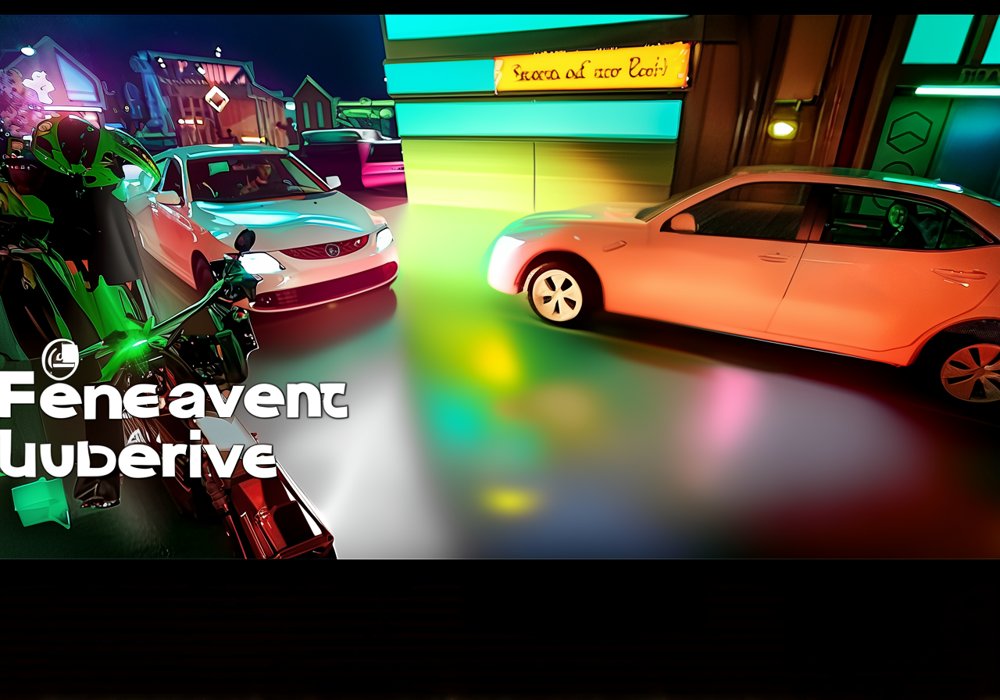

In [43]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to remove the foreground objects detected by the mask segmentation. Run the code and make sure you see a result.

edit_prompt = "Remove foreground text."
foreground_removed_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image4, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_INPAINT_REMOVAL", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

foreground_removed_image.generated_images[0].image.show()


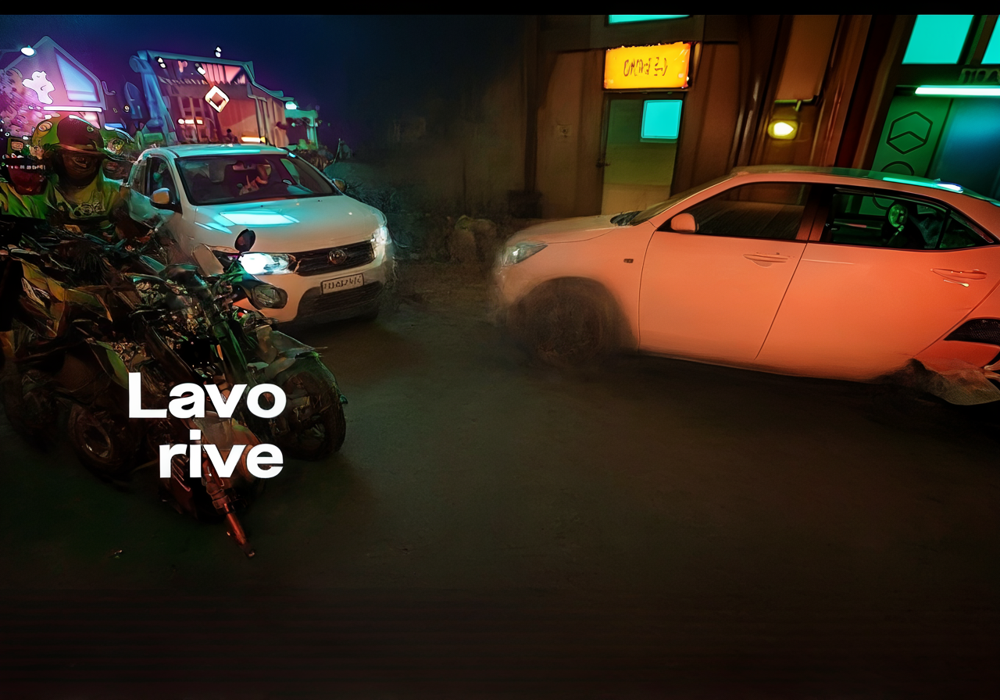

In [44]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to remove the foreground objects detected by the mask segmentation. Run the code and make sure you see a result.

edit_prompt = ""
foreground_removed_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image4, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_INPAINT_REMOVAL", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

foreground_removed_image.generated_images[0].image.show()


In [45]:
# Run the following code to save your foreground_removed_image locally and upload it to Cloud Storage:

filename = "ad without foreground logos, text - aft multiple steps.png"

foreground_removed_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File ad without foreground logos, text - aft multiple steps.png uploaded to ad without foreground logos, text - aft multiple steps.png.


# VS Clear foreground directly - Task 5. Clear the table with inpainting removal
Your team is also interested in an empty background shot of the table without the bowl so that they can do some animation and compositing work. They ask if you can provide that for them.



In [8]:
original_image

Image(
  image_bytes=b'\xff\xd8\xff\xdd\x00\x04\x00\x00\xff\xee\x00\x0eAdobe\x00d\xc0\x00\x00\x00\x01\xff\xc2\x00\x11\x08\x03\xaa\x05x\x03\x00\x11\x00\x01\x11\x01\x02\x11\x02\xff\xdb\x00\xc5\x00\x04\x05\x05\x03\x03\x03\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x01\x02\x02\x02\x02\x01\t\n\x02\x02\x02\n\x08\x07\x05\x07\n\x0b\n\x01\x06\x0c\x0c\x0c\x0c\x0c\n...',
  mime_type='image/png'
)

In [9]:
# Reference Image = Original Ad

raw_ref_image = RawReferenceImage(
    reference_image= original_image,
    reference_id=0
)


In [10]:
raw_ref_image

RawReferenceImage(
  reference_id=0,
  reference_image=Image(
    image_bytes=b'\xff\xd8\xff\xdd\x00\x04\x00\x00\xff\xee\x00\x0eAdobe\x00d\xc0\x00\x00\x00\x01\xff\xc2\x00\x11\x08\x03\xaa\x05x\x03\x00\x11\x00\x01\x11\x01\x02\x11\x02\xff\xdb\x00\xc5\x00\x04\x05\x05\x03\x03\x03\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x02\x01\x02\x02\x02\x02\x01\t\n\x02\x02\x02\n\x08\x07\x05\x07\n\x0b\n\x01\x06\x0c\x0c\x0c\x0c\x0c\n...',
    mime_type='image/png'
  ),
  reference_type='REFERENCE_TYPE_RAW'
)

In [11]:
# Create a MaskReferenceImage that will automatically detect the foreground objects in the provided reference image:

mask_ref_image = MaskReferenceImage(
    # Fill in the appropriate configuration
    reference_id=1,
    reference_image=None,
    config=MaskReferenceConfig(
        mask_mode="MASK_MODE_FOREGROUND",
        mask_dilation=0.1,
    ),
)

mask_ref_image

MaskReferenceImage(
  config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  mask_image_config=MaskReferenceConfig(
    mask_dilation=0.1,
    mask_mode=<MaskReferenceMode.MASK_MODE_FOREGROUND: 'MASK_MODE_FOREGROUND'>
  ),
  reference_id=1,
  reference_type='REFERENCE_TYPE_MASK'
)

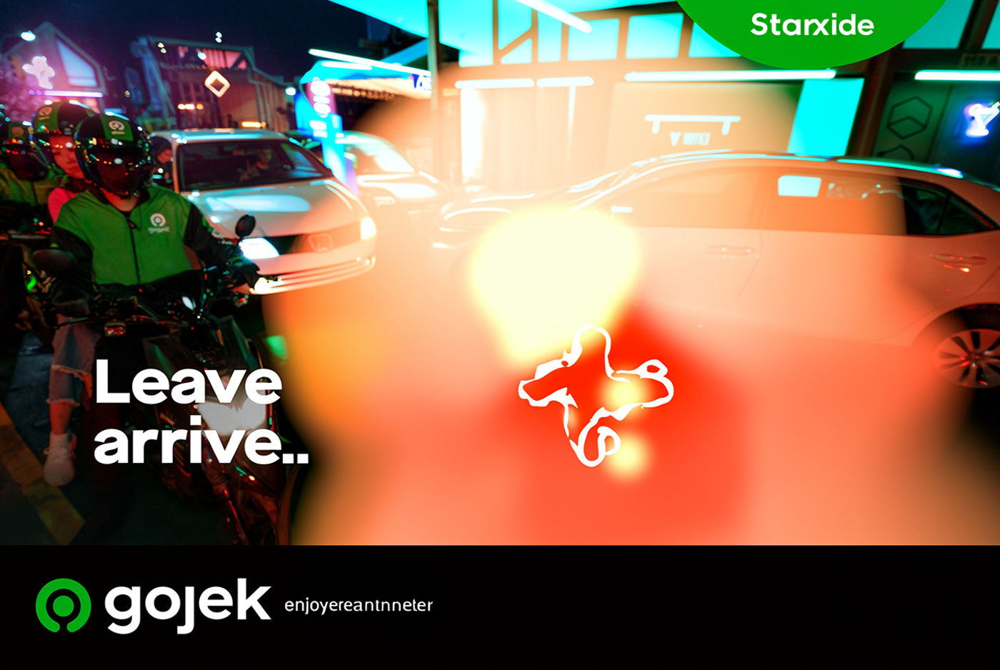

In [13]:
# Replace #ENTER_THE_CORRECT_EDIT_MODE in the code below with the correct edit mode to remove the foreground objects detected by the mask segmentation. Run the code and make sure you see a result.

edit_prompt = "Remove foreground logos and text."
foreground_removed_image = client.models.edit_image(
    model=edit_model_name,
    prompt=edit_prompt,
    reference_images=[raw_ref_image, mask_ref_image],
    config=EditImageConfig(
        edit_mode= "EDIT_MODE_INPAINT_REMOVAL", #ENTER_THE_CORRECT_EDIT_MODE ,
        number_of_images=1,
        safety_filter_level="BLOCK_MEDIUM_AND_ABOVE",
    ),
)

foreground_removed_image.generated_images[0].image.show()


In [39]:
# Run the following code to save your foreground_removed_image locally and upload it to Cloud Storage:

filename = "ad without foreground logos, text.png"

foreground_removed_image.generated_images[0].image.save(filename)
image_editing_utils.upload_file_to_gcs(
    gcs_bucket, filename, filename)

File empty-table.png uploaded to empty-table.png.
